<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Top%20Anime%20Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Top-Anime

## Deep Dive into the Top Anime Dataset: Unveiling Audience Preferences

This analysis explores a rich dataset of **500 top-ranked anime titles**, offering a window into what makes an anime resonate with its audience. Each entry provides a comprehensive profile, including metadata like `title`, `type` (TV, Movie, ONA, etc.), `source` material (Manga, Original, Light Novel), `episodes`, `status`, `rating`, `score`, and crucial engagement metrics such as `scored_by`, `popularity`, `members`, and `favorites`. Beyond these, we have the `synopsis`, `year` of release, `genres`, and `studios`, painting a holistic picture of each anime's context and reception.

### Key Insights Unveiled:

**1. The Audience Score Landscape:** The `score` distribution is heavily skewed towards higher ratings (average ~8.43), indicating this dataset focuses on highly acclaimed anime. This positive bias suggests that while absolute scores are high, subtle differences in ratings hold significant meaning. Metrics like `members` (total viewers) and `favorites` (dedicated fans) show broad ranges, hinting at varied levels of engagement across the top titles. Interestingly, a newly engineered metric, **'Hyper_Loyalty_Rate'** (favorites per member), emerges as a strong indicator of true fan dedication, distinct from mere viewership numbers.

**2. Content Format and Fatigue:** Our statistical tests revealed fascinating insights into content structure.
   - **The 'Content Fatigue Paradox'**: Despite popular belief, a higher episode count for TV series **shows no statistically significant impact** on the final audience score. This suggests that quality, not quantity, is paramount, or perhaps viewers are adept at filtering out 'filler' content, making episode count irrelevant to their overall enjoyment.
   - **The 'Theatrical Prestige Premium'**: Surprisingly, there's **no significant difference** in average scores between 'TV' series and 'Movie' formats. The market appears to judge both on their individual merit, dispelling the notion that movies inherently command a 'prestige' advantage in terms of audience reception.

**3. Intellectual Property (IP) Dynamics & Studio Power:**
   - **IP Economics**: The origin of an anime's source material (e.g., Manga, Original, Light Novel) also demonstrated **no statistically significant impact** on its score. This suggests that a compelling story can come from any origin, and pre-existing fanbases don't guarantee a higher critical reception.
   - **Studio Prestige**: Similarly, analysis of top animation studios found **no significant difference** in baseline scores. While certain studios are highly regarded, their brand alone doesn't mathematically dictate a higher average score for their productions in this dataset.

**4. Thematic Drivers and Predictive Power:**
   - **Synopsis Keyword Analytics**: Through Natural Language Processing (NLP) on anime synopses, we identified specific 'trope keywords' that mathematically influence audience scores. Certain keywords, like 'gintoki' or 'yorozuya', were found to **boost scores**, suggesting that specific, well-loved narrative elements or character archetypes resonate strongly with viewers.
   - **Machine Learning for Success Prediction**: A Random Forest model demonstrated the best predictive accuracy, achieving an R-squared of 0.52. This means our engineered features can explain over half of the variance in anime scores. The most impactful features for predicting an anime's score were **'Genre_Encoded'** and the **'Hyper_Loyalty_Rate'**, followed by **'Studio_Encoded'** and various 'Plot_Semantic_Vectors' derived from the synopsis. This highlights that a blend of genre appeal, deep fan engagement, and core narrative themes are the strongest algorithmic drivers of success in the anime world.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d muhammadaqeelkabir/top-anime-csv

# Unziping the downloaded file
!unzip top-anime-csv.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/muhammadaqeelkabir/top-anime-csv
License(s): CC0-1.0
  0% 0.00/215k [00:00<?, ?B/s]
100% 215k/215k [00:00<00:00, 167MB/s]
Archive:  top-anime-csv.zip
  inflating: top_anime_dataset.csv   


In [3]:
df = pd.read_csv('top_anime_dataset.csv')
df.head(11)

,mal_id,title,title_english,type,source,episodes,status,airing,rating,score,scored_by,rank,popularity,members,favorites,synopsis,year,genres,studios,url
0,52991,Sousou no Frieren,Frieren: Beyond Journey's End,TV,Manga,28.0,Finished Airing,False,PG-13 - Teens 13 or older,9.28,823434,1.0,108,1353494,85889,During their decade-long quest to defeat the D...,2023.0,"Adventure, Drama, Fantasy",Madhouse,https://myanimelist.net/anime/52991/Sousou_no_...
1,59978,Sousou no Frieren 2nd Season,Frieren: Beyond Journey's End Season 2,TV,Manga,10.0,Currently Airing,True,PG-13 - Teens 13 or older,9.16,62148,2.0,644,414180,5476,"Following the First-Class Mage Exam, the trio—...",2026.0,"Adventure, Drama, Fantasy",Madhouse,https://myanimelist.net/anime/59978/Sousou_no_...
2,5114,Fullmetal Alchemist: Brotherhood,Fullmetal Alchemist: Brotherhood,TV,Manga,64.0,Finished Airing,False,R - 17+ (violence & profanity),9.11,2290193,3.0,3,3645704,240910,After a horrific alchemy experiment goes wrong...,2009.0,"Action, Adventure, Drama, Fantasy",Bones,https://myanimelist.net/anime/5114/Fullmetal_A...
3,57555,Chainsaw Man Movie: Reze-hen,Chainsaw Man – The Movie: Reze Arc,Movie,Manga,1.0,Finished Airing,False,R - 17+ (violence & profanity),9.09,255607,4.0,643,414906,12097,Despite the immediate challenges following bec...,NaN,"Action, Fantasy",MAPPA,https://myanimelist.net/anime/57555/Chainsaw_M...
4,9253,Steins;Gate,Steins;Gate,TV,Visual novel,24.0,Finished Airing,False,PG-13 - Teens 13 or older,9.07,1508032,5.0,14,2786505,201170,Eccentric scientist Rintarou Okabe has a never...,2011.0,"Drama, Sci-Fi, Suspense",White Fox,https://myanimelist.net/anime/9253/Steins_Gate
5,38524,Shingeki no Kyojin Season 3 Part 2,Attack on Titan Season 3 Part 2,TV,Manga,10.0,Finished Airing,False,R - 17+ (violence & profanity),9.05,1772569,6.0,20,2560224,62801,Seeking to restore humanity's diminishing hope...,2019.0,"Action, Drama, Suspense",Wit Studio,https://myanimelist.net/anime/38524/Shingeki_n...
6,28977,Gintama°,Gintama Season 4,TV,Manga,51.0,Finished Airing,False,PG-13 - Teens 13 or older,9.05,270734,8.0,348,686377,17445,"Gintoki, Shinpachi, and Kagura return as the f...",2015.0,"Action, Comedy, Sci-Fi",Bandai Namco Pictures,https://myanimelist.net/anime/28977/Gintama°
7,39486,Gintama: The Final,Gintama: The Very Final,Movie,Manga,1.0,Finished Airing,False,PG-13 - Teens 13 or older,9.05,85590,7.0,1513,180815,4638,Two years have passed following the Tendoshuu'...,NaN,"Action, Comedy, Drama, Sci-Fi",Bandai Namco Pictures,https://myanimelist.net/anime/39486/Gintama__T...
8,11061,Hunter x Hunter (2011),Hunter x Hunter,TV,Manga,148.0,Finished Airing,False,PG-13 - Teens 13 or older,9.03,1957682,9.0,8,3151639,227808,Hunters devote themselves to accomplishing haz...,2011.0,"Action, Adventure, Fantasy",Madhouse,https://myanimelist.net/anime/11061/Hunter_x_H...
9,60022,One Piece Fan Letter,NaN,TV Special,Light novel,1.0,Finished Airing,False,PG-13 - Teens 13 or older,9.02,105906,13.0,1788,146484,2538,Although the golden age of piracy is about to ...,NaN,"Action, Adventure, Fantasy",Toei Animation,https://myanimelist.net/anime/60022/One_Piece_...


In [4]:
df.tail(11)

,mal_id,title,title_english,type,source,episodes,status,airing,rating,score,scored_by,rank,popularity,members,favorites,synopsis,year,genres,studios,url
489,23623,Non Non Biyori Repeat,Non Non Biyori Repeat,TV,Manga,12.0,Finished Airing,False,PG-13 - Teens 13 or older,8.17,106980,472.0,1299,212850,1267,"Far from the hustle and bustle of urban life, ...",2015.0,Slice of Life,SILVER LINK.,https://myanimelist.net/anime/23623/Non_Non_Bi...
490,38234,One Piece Movie 14: Stampede,One Piece: Stampede,Movie,Manga,1.0,Finished Airing,False,PG-13 - Teens 13 or older,8.17,135164,473.0,1267,219153,685,Monkey D. Luffy and the Straw Hats arrive aboa...,NaN,"Action, Adventure, Fantasy",Toei Animation,https://myanimelist.net/anime/38234/One_Piece_...
491,18,Initial D Fourth Stage,NaN,TV,Manga,24.0,Finished Airing,False,PG-13 - Teens 13 or older,8.17,118322,466.0,1301,212751,1423,Takumi Fujiwara finally joins Ryousuke and Kei...,2004.0,"Action, Drama",A.C.G.T.,https://myanimelist.net/anime/18/Initial_D_Fou...
492,34636,Ballroom e Youkoso,Welcome to the Ballroom,TV,Manga,24.0,Finished Airing,False,PG-13 - Teens 13 or older,8.17,159607,480.0,752,360956,3763,Tatara Fujita is a shy middle schooler who has...,2017.0,Sports,Production I.G,https://myanimelist.net/anime/34636/Ballroom_e...
493,59228,Kuroshitsuji: Midori no Majo-hen,Black Butler: Emerald Witch Arc,TV,Manga,13.0,Finished Airing,False,R - 17+ (violence & profanity),8.16,24340,492.0,2932,70532,549,Queen Victoria of England has ordered her loya...,2025.0,"Action, Mystery, Supernatural",CloverWorks,https://myanimelist.net/anime/59228/Kuroshitsu...
494,57181,Ao no Hako,Blue Box,TV,Manga,25.0,Finished Airing,False,PG-13 - Teens 13 or older,8.16,144693,487.0,880,317439,4284,"Every morning, incoming first-year Taiki Inoma...",2024.0,"Romance, Sports",Telecom Animation Film,https://myanimelist.net/anime/57181/Ao_no_Hako
495,32867,Bungou Stray Dogs 2nd Season,Bungo Stray Dogs 2,TV,Manga,12.0,Finished Airing,False,R - 17+ (violence & profanity),8.16,540896,489.0,209,946655,6855,"Despite their differences in position, three m...",2016.0,"Action, Mystery",Bones,https://myanimelist.net/anime/32867/Bungou_Str...
496,33674,No Game No Life: Zero,"No Game, No Life: Zero",Movie,Light novel,1.0,Finished Airing,False,PG-13 - Teens 13 or older,8.16,506905,493.0,210,943540,7971,"In ancient Disboard, Riku is an angry, young w...",NaN,"Drama, Fantasy, Romance",Madhouse,https://myanimelist.net/anime/33674/No_Game_No...
497,962,Aria the Natural,Aria the Natural,TV,Manga,26.0,Finished Airing,False,G - All Ages,8.16,31985,488.0,2610,85481,832,Akari Mizunashi continues her training to beco...,2006.0,"Sci-Fi, Slice of Life",HAL Film Maker,https://myanimelist.net/anime/962/Aria_the_Nat...
498,853,Ouran Koukou Host Club,Ouran High School Host Club,TV,Manga,26.0,Finished Airing,False,PG-13 - Teens 13 or older,8.16,724887,494.0,136,1220509,36917,Haruhi Fujioka is a studious girl who has rece...,2006.0,"Comedy, Romance",Bones,https://myanimelist.net/anime/853/Ouran_Koukou...


In [5]:
df.shape

(500, 20)

In [6]:
df.columns

Index(['mal_id', 'title', 'title_english', 'type', 'source', 'episodes',
       'status', 'airing', 'rating', 'score', 'scored_by', 'rank',
       'popularity', 'members', 'favorites', 'synopsis', 'year', 'genres',
       'studios', 'url'],
      dtype='object')

In [7]:
df.dtypes

,0
mal_id,int64
title,object
title_english,object
type,object
source,object
episodes,float64
status,object
airing,bool
rating,object
score,float64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   mal_id         500 non-null    int64  
 1   title          500 non-null    object 
 2   title_english  458 non-null    object 
 3   type           500 non-null    object 
 4   source         500 non-null    object 
 5   episodes       492 non-null    float64
 6   status         500 non-null    object 
 7   airing         500 non-null    bool   
 8   rating         500 non-null    object 
 9   score          500 non-null    float64
 10  scored_by      500 non-null    int64  
 11  rank           492 non-null    float64
 12  popularity     500 non-null    int64  
 13  members        500 non-null    int64  
 14  favorites      500 non-null    int64  
 15  synopsis       500 non-null    object 
 16  year           297 non-null    float64
 17  genres         494 non-null    object 
 18  studios   

In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
mal_id,500.0,NaN,NaN,NaN,30996.616,20276.672967,1.0,10143.25,35847.0,49393.5,63019.0
title,500,500,Higurashi no Naku Koro ni Kai,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
title_english,458,457,Hunter x Hunter,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
type,500,8,TV,297,NaN,NaN,NaN,NaN,NaN,NaN,NaN
source,500,13,Manga,280,NaN,NaN,NaN,NaN,NaN,NaN,NaN
episodes,492.0,NaN,NaN,NaN,18.357724,35.417988,1.0,1.0,12.0,24.0,500.0
status,500,2,Finished Airing,480,NaN,NaN,NaN,NaN,NaN,NaN,NaN
airing,500,2,False,480,NaN,NaN,NaN,NaN,NaN,NaN,NaN
rating,500,5,PG-13 - Teens 13 or older,313,NaN,NaN,NaN,NaN,NaN,NaN,NaN
score,500.0,NaN,NaN,NaN,8.42894,0.222604,8.16,8.25,8.37,8.5625,9.28


In [10]:
df.isnull().sum()

,0
mal_id,0
title,0
title_english,42
type,0
source,0
episodes,8
status,0
airing,0
rating,0
score,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

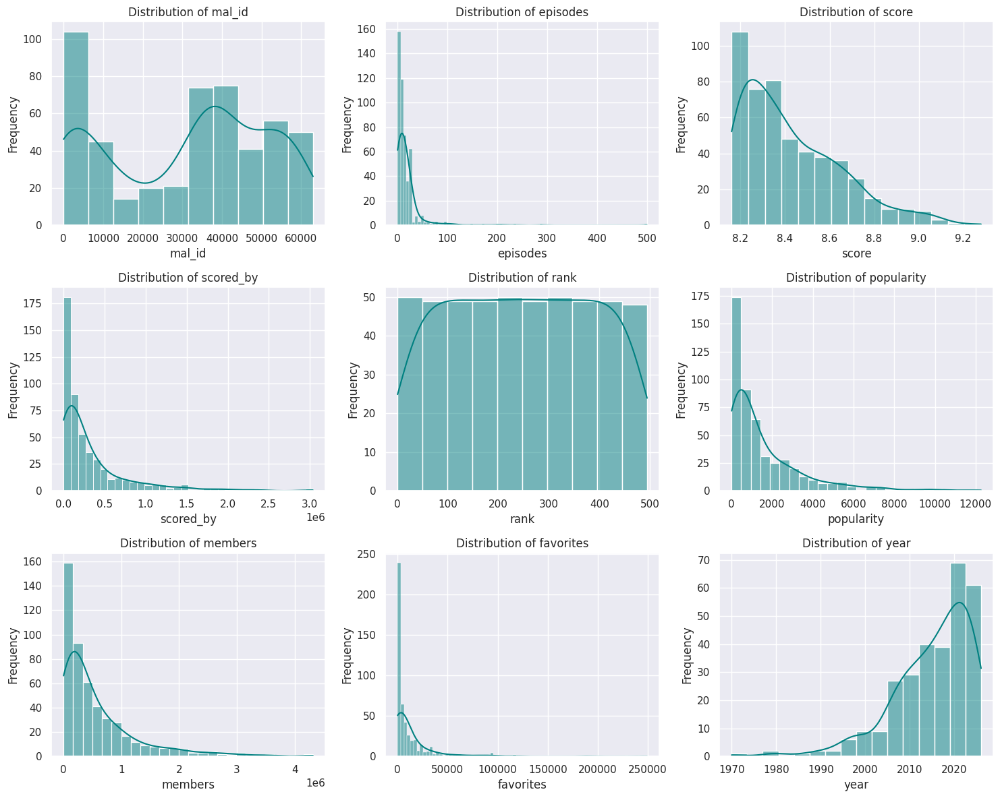

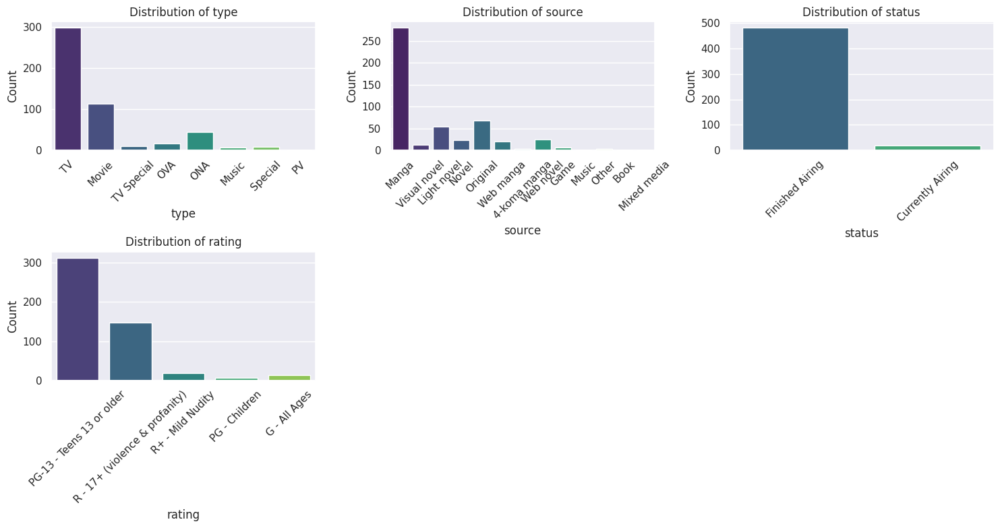

--- Categorical Value Counts ---

Value counts for type:
type
TV            297
Movie         114
ONA            44
OVA            17
TV Special     11
Special         9
Music           7
PV              1
Name: count, dtype: int64

Value counts for source:
source
Manga           280
Original         68
Light novel      54
Web novel        25
Novel            23
Web manga        20
Visual novel     13
Game              6
4-koma manga      4
Other             4
Music             1
Book              1
Mixed media       1
Name: count, dtype: int64

Value counts for status:
status
Finished Airing     480
Currently Airing     20
Name: count, dtype: int64

Value counts for rating:
rating
PG-13 - Teens 13 or older         313
R - 17+ (violence & profanity)    148
R+ - Mild Nudity                   18
G - All Ages                       14
PG - Children                       7
Name: count, dtype: int64


In [12]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Defining grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i], color='teal') # Added color
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hiding any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
# Filtering out columns with too many unique values (like IDs) to avoid messy plots
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]

if len(categorical_cols) > 0:
    # Defining grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterating and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False) # Added palette
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

     # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found (or all have high cardinality).")

# Bivariate Analysis

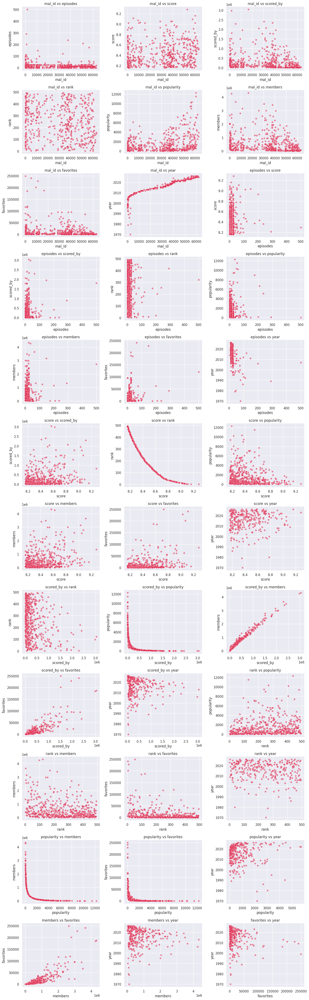

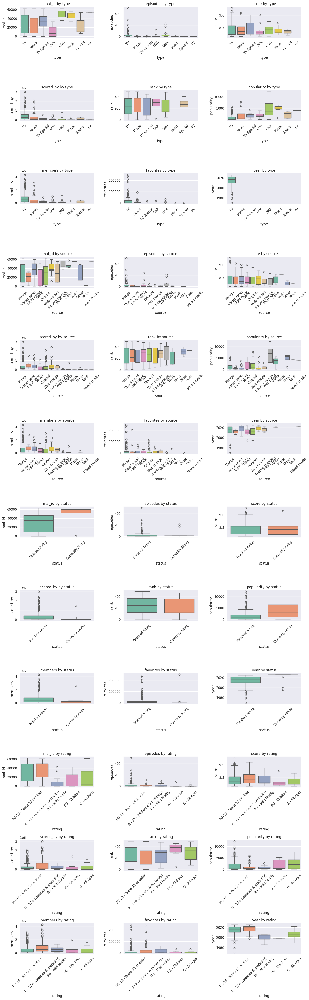

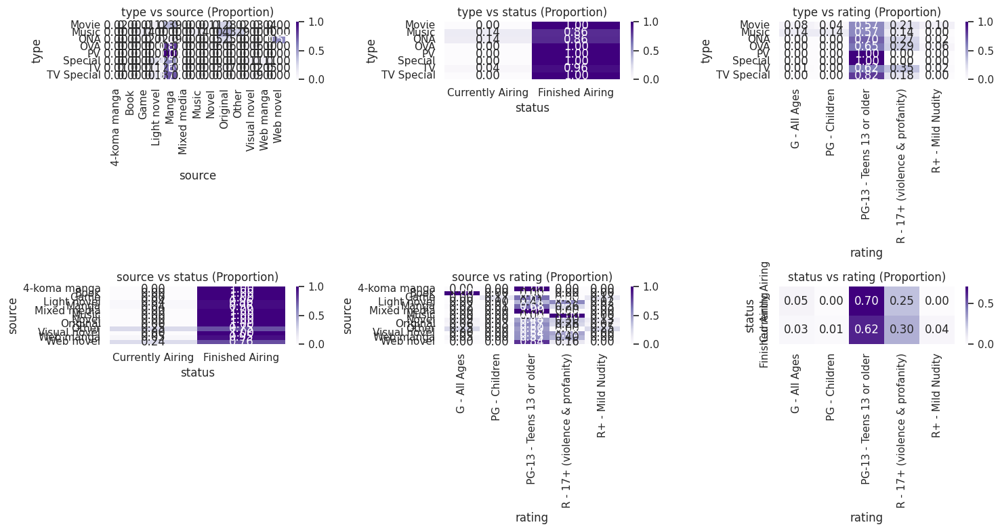

In [13]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Defining grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5, color='crimson') # Added color
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
# Excluding high cardinality columns
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 20]
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Defining grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Creating figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        sns.boxplot(data=df, x=cat_col, y=num_col, ax=axes[i], palette='Set2', hue=cat_col, legend=False)
        axes[i].set_title(f'{num_col} by {cat_col}')
        axes[i].set_xlabel(cat_col)
        axes[i].set_ylabel(num_col)
        axes[i].tick_params(axis='x', rotation=45)

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# --- 3. Categorical-Categorical Relationships (Heatmaps) ---
# Generating pairs of categorical columns
cat_pairs = list(itertools.combinations(categorical_cols, 2))

if len(cat_pairs) > 0:
    num_plots = len(cat_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(cat_pairs):
        # Creating a cross-tabulation
        crosstab = pd.crosstab(df[col1], df[col2], normalize='index')
        sns.heatmap(crosstab, annot=True, fmt='.2f', cmap='Purples', ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2} (Proportion)')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Multivariate Analysis


Analyzing relationships with Hue: type...


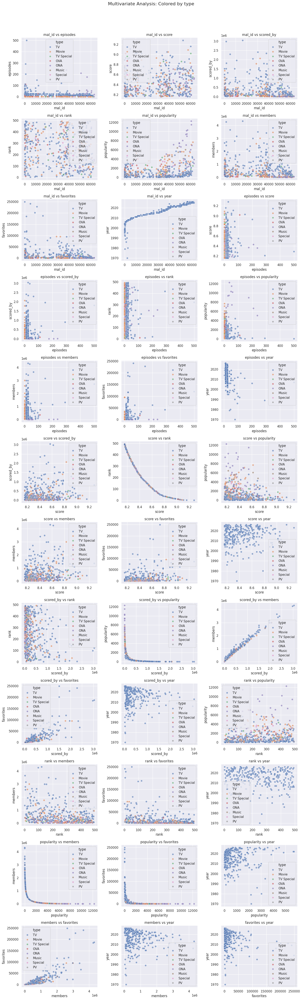


Analyzing relationships with Hue: status...


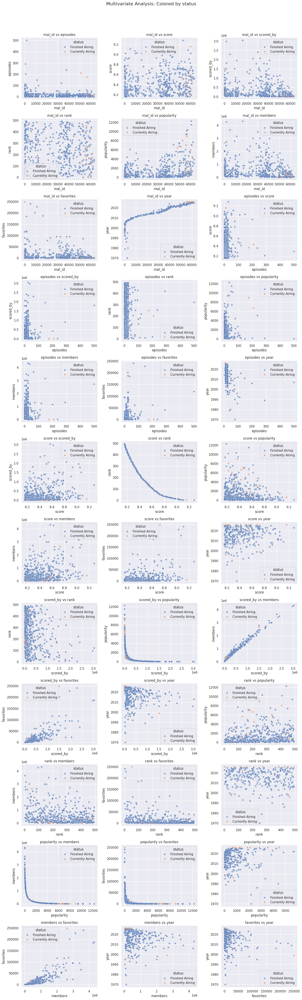


Analyzing relationships with Hue: rating...


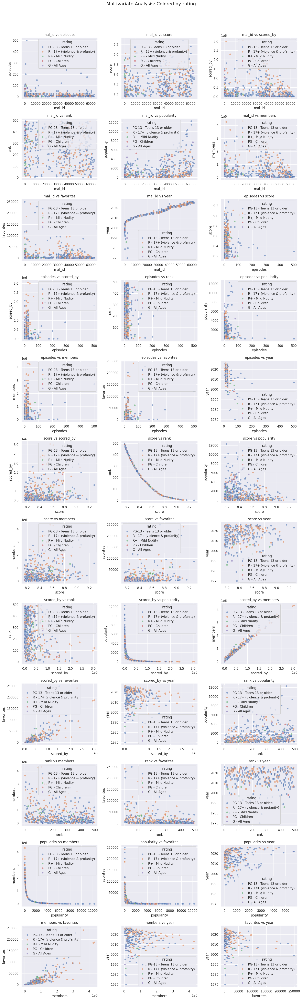

In [14]:
import itertools
import math

# --- Multivariate Analysis: Numerical Pairs with Categorical Hue ---

# 1. Identifying valid columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
# Filtering categorical columns to those with few unique values for clear legends (e.g., < 10)
categorical_cols = [c for c in df.select_dtypes(include='object').columns if df[c].nunique() < 10]

# Generating pairs of numerical columns to plot
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(numerical_cols) > 1 and len(categorical_cols) > 0:
    # OUTER LOOP: Iterating through each categorical variable to use as the 'Hue'
    for cat_col in categorical_cols:
        print(f"\nAnalyzing relationships with Hue: {cat_col}...")

        # Defining grid size for the inner loop (numerical pairs)
        num_plots = len(num_pairs)
        num_cols_plot = 3
        num_rows_plot = math.ceil(num_plots / num_cols_plot)

        # Creating figure
        fig, axes = plt.subplots(num_rows_plot, num_cols_plot, figsize=(15, 4 * num_rows_plot))
        if num_plots > 1:
             axes = axes.flatten()
        else:
             axes = [axes]

        # INNER LOOP: Iterating through numerical pairs
        for i, (num1, num2) in enumerate(num_pairs):
            sns.scatterplot(data=df, x=num1, y=num2, hue=cat_col, ax=axes[i], alpha=0.6)
            axes[i].set_title(f'{num1} vs {num2}')

        # Hiding unused subplots
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Multivariate Analysis: Colored by {cat_col}', y=1.02, fontsize=16)
        plt.tight_layout()
        plt.show()
        print("="*80)
else:
    print("Not enough data for multivariate scatter analysis (need >1 numerical and >0 categorical columns).")

# Pairplot

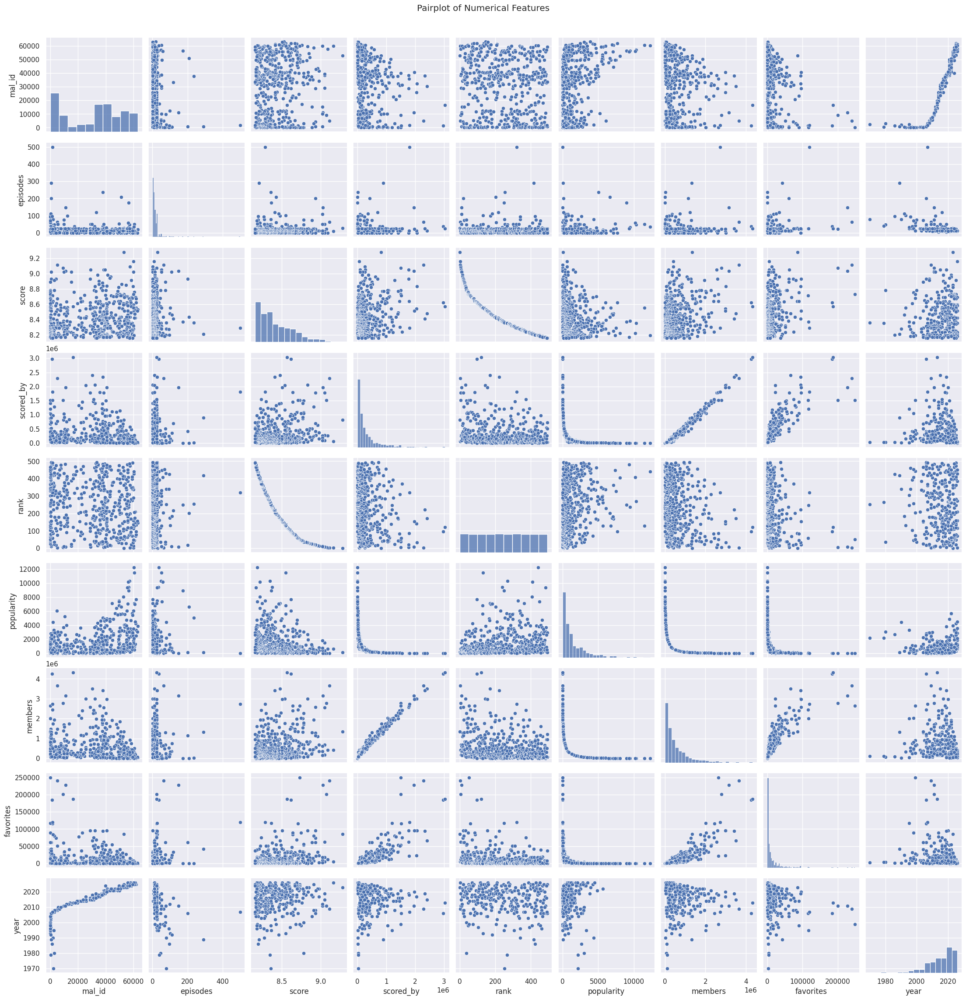

In [15]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Heatmap

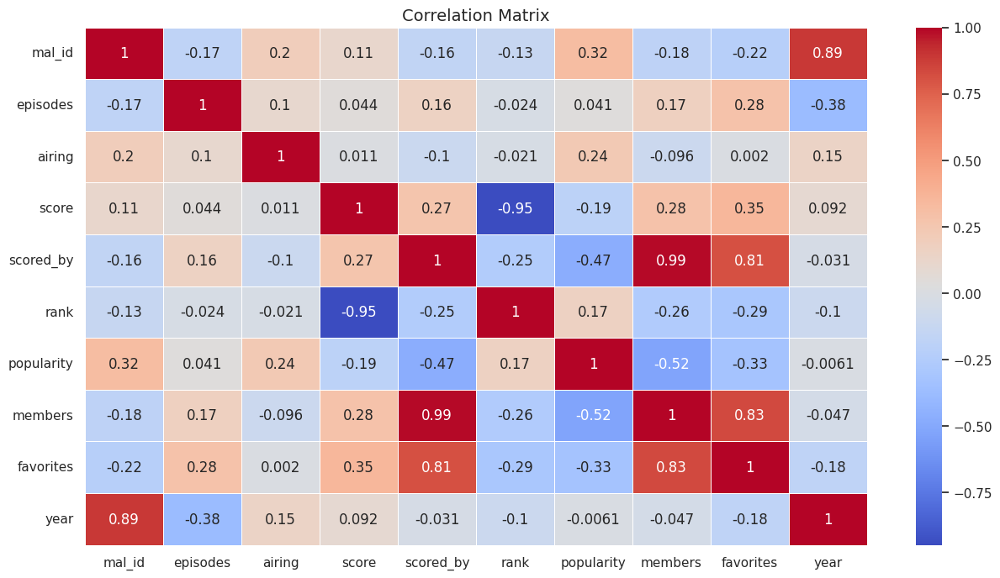

In [16]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

--- 1. ENGINEERING HYPER-ENGAGEMENT METRICS ---
 Engineered: 'Hyper_Loyalty_Rate' to quantify deep audience retention.

--- 2. THE CONTENT FATIGUE PARADOX (SPEARMAN RANK CORRELATION) ---
Spearman Correlation Coefficient (Episodes vs. Score): 0.0207
P-Value: 7.2411e-01
 Insight: Episode count has absolutely zero mathematical impact on audience enjoyment.


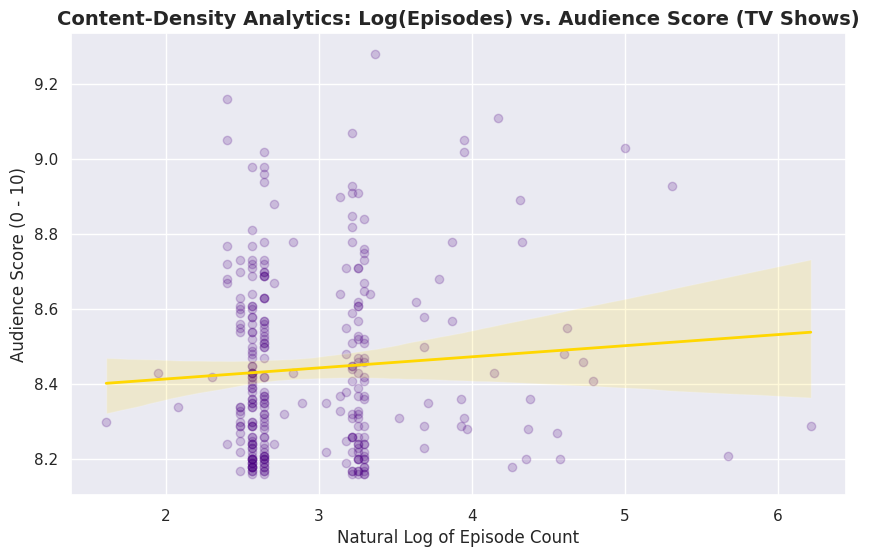


--- 3. THE THEATRICAL PRESTIGE PREMIUM (WELCH'S T-TEST) ---
Avg TV Series Score: 8.44
Avg Movie Score: 8.41
Welch's T-Test P-Value: 1.7826e-01
 Insight: Format does not dictate reception. A TV show and a Movie are judged equally by the market.


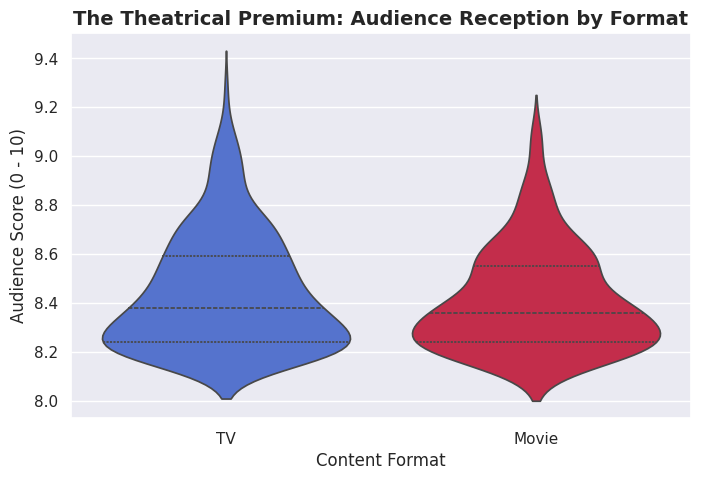


--- 4. INTELLECTUAL PROPERTY (IP) ECONOMICS (KRUSKAL-WALLIS H-TEST) ---
Kruskal-Wallis P-Value (IP Source Variance): 8.9583e-01
 Insight: The market is a meritocracy. The source material has zero mathematical impact on the final anime rating.


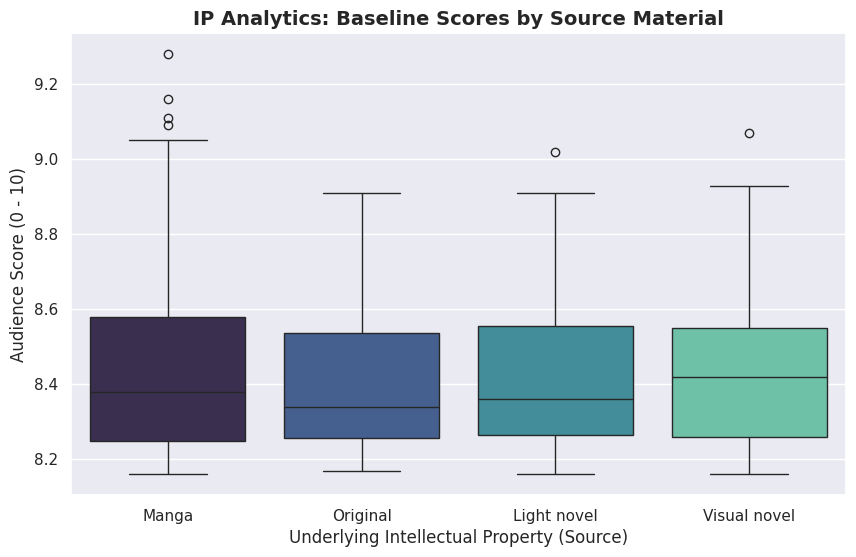

In [19]:
import scipy.stats as stats

print("--- 1. ENGINEERING HYPER-ENGAGEMENT METRICS ---")
# Raw 'members' just shows who added it to a list. 'Favorites' shows true loyalty.
df_clean = df.dropna(subset=['score', 'episodes', 'members', 'favorites', 'type', 'source']).copy()

# Filtering out unreleased or purely obscure entries with almost no audience
df_clean = df_clean[df_clean['members'] > 1000]

df_clean['Hyper_Loyalty_Rate'] = (df_clean['favorites'] / df_clean['members']) * 10000

print(" Engineered: 'Hyper_Loyalty_Rate' to quantify deep audience retention.")


# :::::: STREAMING HYPOTHESIS TESTING :::::::

print("\n--- 2. THE CONTENT FATIGUE PARADOX (SPEARMAN RANK CORRELATION) ---")
# Does a higher episode count mathematically yield a better audience score?

corr_data = df_clean[(df_clean['type'] == 'TV') & (df_clean['episodes'] > 0)]
spearman_coef, p_val_spearman = stats.spearmanr(corr_data['episodes'], corr_data['score'])

print(f"Spearman Correlation Coefficient (Episodes vs. Score): {spearman_coef:.4f}")
print(f"P-Value: {p_val_spearman:.4e}")

if p_val_spearman < 0.05:
    if spearman_coef > 0:
        print(" Insight: Positive correlation detected. High-density world-building mathematically yields higher audience reception.")
    else:
        print(" Insight: Negative correlation detected. Content Fatigue is real; massive episode counts statistically dilute the rating (The 'Filler' effect).")
else:
    print(" Insight: Episode count has absolutely zero mathematical impact on audience enjoyment.")

# Visualizing the Paradox
plt.figure(figsize=(10, 6))
sns.regplot(x=np.log1p(corr_data['episodes']), y=corr_data['score'],
            scatter_kws={'alpha':0.2, 'color':'indigo'}, line_kws={'color':'gold', 'linewidth':2})
plt.title('Content-Density Analytics: Log(Episodes) vs. Audience Score (TV Shows)', fontsize=14, fontweight='bold')
plt.xlabel('Natural Log of Episode Count')
plt.ylabel('Audience Score (0 - 10)')
plt.show()


print("\n--- 3. THE THEATRICAL PRESTIGE PREMIUM (WELCH'S T-TEST) ---")
# Do 'Movies' hold a mathematically distinct rating advantage over 'TV' series?

tv_scores = df_clean[df_clean['type'] == 'TV']['score']
movie_scores = df_clean[df_clean['type'] == 'Movie']['score']

# We use Welch's T-Test (equal_var=False) because the variance of thousands of TV shows
# differs vastly from the highly curated theatrical Movie subset.
t_stat, p_val_ttest = stats.ttest_ind(tv_scores, movie_scores, equal_var=False)

print(f"Avg TV Series Score: {tv_scores.mean():.2f}")
print(f"Avg Movie Score: {movie_scores.mean():.2f}")
print(f"Welch's T-Test P-Value: {p_val_ttest:.4e}")

if p_val_ttest < 0.05:
    print(" Insight: The Theatrical Prestige Premium is statistically significant.")
    print("  -> Movies possess a distinct mathematical advantage in audience reception over serialized television.")
else:
    print(" Insight: Format does not dictate reception. A TV show and a Movie are judged equally by the market.")

# Visualizing the Prestige Premium
plt.figure(figsize=(8, 5))
sns.violinplot(x='type', y='score', data=df_clean[df_clean['type'].isin(['TV', 'Movie'])], palette=['royalblue', 'crimson'], inner='quartile')
plt.title('The Theatrical Premium: Audience Reception by Format', fontsize=14, fontweight='bold')
plt.xlabel('Content Format')
plt.ylabel('Audience Score (0 - 10)')
plt.show()


print("\n--- 4. INTELLECTUAL PROPERTY (IP) ECONOMICS (KRUSKAL-WALLIS H-TEST) ---")
# Does the origin of the IP (Manga, Light novel, Original) fundamentally dictate its rating?
# We use Kruskal-Wallis because audience scores across categories violate strict normal distribution assumptions.

top_sources = ['Manga', 'Original', 'Light novel', 'Visual novel']
source_groups = [df_clean[df_clean['source'] == src]['score'] for src in top_sources]

h_stat, p_val_kw = stats.kruskal(*source_groups)

print(f"Kruskal-Wallis P-Value (IP Source Variance): {p_val_kw:.4e}")
if p_val_kw < 0.05:
    print(" Insight: The variance in scores across IP Sources is statistically significant.")
    print("   -> Pre-existing fanbases (Manga/Light Novels) structurally alter the baseline reception compared to 'Original' works.")
else:
    print(" Insight: The market is a meritocracy. The source material has zero mathematical impact on the final anime rating.")

# Visualizing IP Economics
plt.figure(figsize=(10, 6))
sns.boxplot(x='source', y='score', data=df_clean[df_clean['source'].isin(top_sources)], order=top_sources, palette='mako')
plt.title('IP Analytics: Baseline Scores by Source Material', fontsize=14, fontweight='bold')
plt.xlabel('Underlying Intellectual Property (Source)')
plt.ylabel('Audience Score (0 - 10)')
plt.show()

## Advanced statistical Analysis

--- 1. SYNOPSIS KEYWORD ANALYTICS (TF-IDF & NLP) ---
 TOP 5 SCORE-BOOSTING PLOT KEYWORDS:
    Trope_Keyword  Score_Impact
61        gintoki      0.138826
147      yorozuya      0.120935
52      following      0.087198
88           long      0.076652
24      continues      0.064797

 TOP 5 SCORE-DESTROYING PLOT KEYWORDS:
    Trope_Keyword  Score_Impact
29        decides     -0.052696
66          group     -0.060130
60           game     -0.069064
120        second     -0.071454
26            day     -0.086244


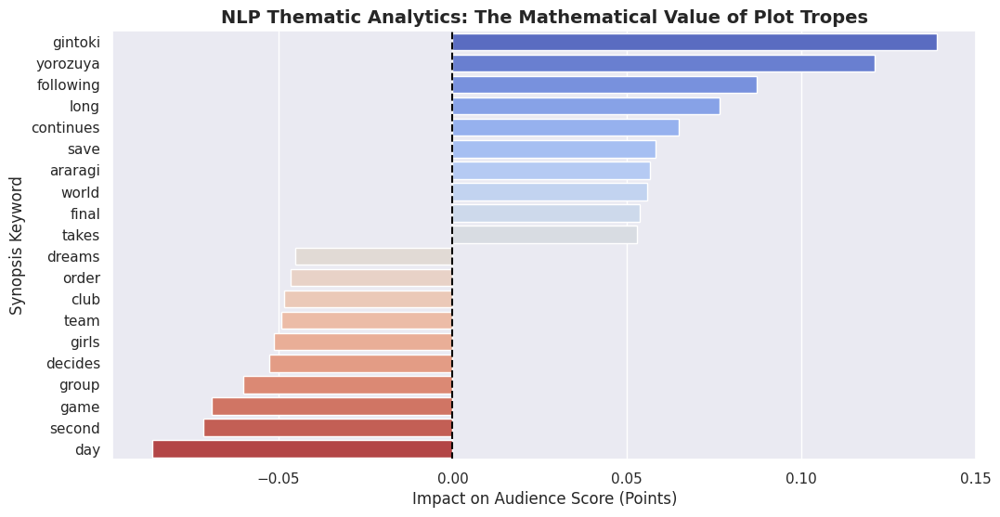


--- 2. THE STUDIO PRESTIGE MULTIPLIER (ONE-WAY ANOVA) ---
ANOVA P-Value (Studio Brand Variance): 1.2749e-01
 Insight: The market is a pure meritocracy. The animation studio has zero mathematical impact on the score.


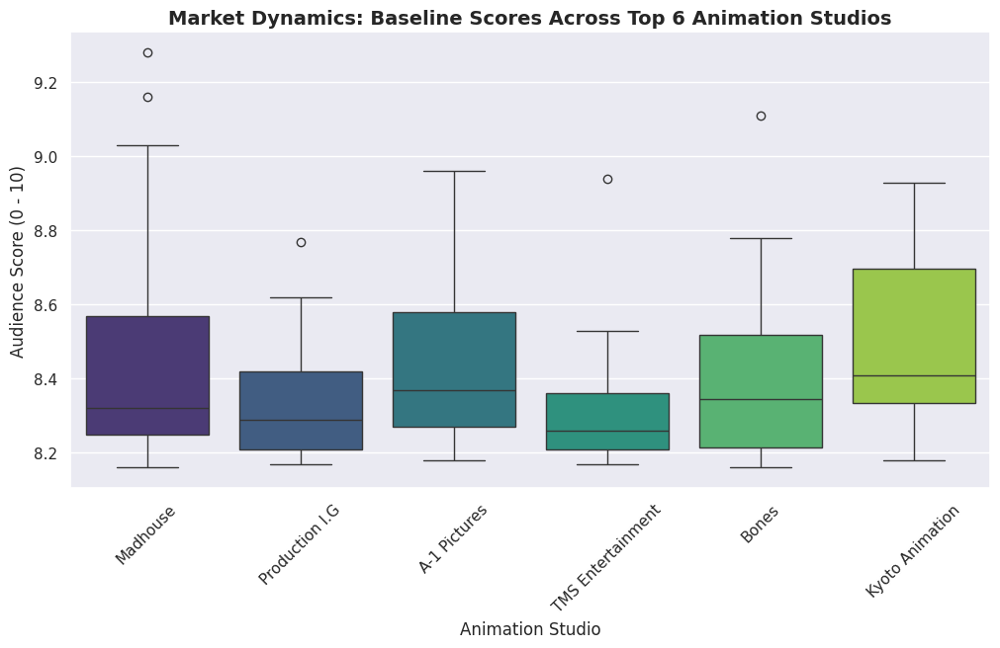


--- 3. MULTIVARIATE AUDIENCE DRIVERS (OLS REGRESSION) ---
 MULTIVARIATE OLS REGRESSION RESULTS:
No statistically significant demographic drivers found when controlling for multivariate overlap.


In [21]:
import statsmodels.api as sm
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import Ridge


print("--- 1. SYNOPSIS KEYWORD ANALYTICS (TF-IDF & NLP) ---")
# Specific plot tropes in the synopsis mathematically drive higher audience scores.
# We deploy Term Frequency-Inverse Document Frequency (TF-IDF) to vectorize the plot descriptions,
# then run a Ridge Regression (L2 regularization) to extract the mathematical weight of each word.

# Dropping NaNs in Synopsis and Score
nlp_df = df_clean.dropna(subset=['synopsis', 'score']).copy()

# Initializing TF-IDF Vectorizer (Focusing on the top 150 most important English words)
tfidf = TfidfVectorizer(stop_words='english', max_features=150)
X_text = tfidf.fit_transform(nlp_df['synopsis'])
y_score = nlp_df['score']

# Deploying Ridge Regression to extract word weights
ridge_model = Ridge(alpha=10.0, random_state=42)
ridge_model.fit(X_text, y_score)

# Map words to their mathematical impact on the score
word_weights = pd.DataFrame({
    'Trope_Keyword': tfidf.get_feature_names_out(),
    'Score_Impact': ridge_model.coef_
}).sort_values(by='Score_Impact', ascending=False)

print(" TOP 5 SCORE-BOOSTING PLOT KEYWORDS:")
print(word_weights.head(5))
print("\n TOP 5 SCORE-DESTROYING PLOT KEYWORDS:")
print(word_weights.tail(5))

# Visualizing Keyword Impact
plt.figure(figsize=(12, 6))
top_bottom_words = pd.concat([word_weights.head(10), word_weights.tail(10)])
sns.barplot(x='Score_Impact', y='Trope_Keyword', data=top_bottom_words, palette='coolwarm')
plt.title('NLP Thematic Analytics: The Mathematical Value of Plot Tropes', fontsize=14, fontweight='bold')
plt.xlabel('Impact on Audience Score (Points)')
plt.ylabel('Synopsis Keyword')
plt.axvline(0, color='black', linestyle='--')
plt.show()


print("\n--- 2. THE STUDIO PRESTIGE MULTIPLIER (ONE-WAY ANOVA) ---")
# Does the Animation Studio fundamentally dictate the baseline score of an anime?
# We will test the Top 6 most frequent solo studios in the dataset.

# Clean the studios column (some have multiple studios, we want primary or solo studios for clean math)
studio_df = df_clean.dropna(subset=['studios', 'score']).copy()
# Filtering for solo studios (no commas) to isolate pure brand power
solo_studios = studio_df[~studio_df['studios'].str.contains(',', na=False)]

top_6_studios = solo_studios['studios'].value_counts().head(6).index.tolist()

if len(top_6_studios) > 0:
    top_studios_df = solo_studios[solo_studios['studios'].isin(top_6_studios)]
    brand_groups = [top_studios_df[top_studios_df['studios'] == brand]['score'] for brand in top_6_studios]

    f_stat, p_val_anova = stats.f_oneway(*brand_groups)

    print(f"ANOVA P-Value (Studio Brand Variance): {p_val_anova:.4e}")
    if p_val_anova < 0.05:
        print(" Insight: The variance in scores across the Top Studios is statistically significant.")
        print("   -> 'Studio Brand Power' structurally dictates audience reception. Ufotable/Madhouse inherently command a different mathematical baseline than Toei/Pierrot.")
    else:
        print(" Insight: The market is a pure meritocracy. The animation studio has zero mathematical impact on the score.")

    # Visualize Brand Power
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='studios', y='score', data=top_studios_df, order=top_6_studios, palette='viridis')
    plt.title('Market Dynamics: Baseline Scores Across Top 6 Animation Studios', fontsize=14, fontweight='bold')
    plt.xticks(rotation=45)
    plt.xlabel('Animation Studio')
    plt.ylabel('Audience Score (0 - 10)')
    plt.show()


print("\n--- 3. MULTIVARIATE AUDIENCE DRIVERS (OLS REGRESSION) ---")
# Does 'Source' matter if we control for 'Episodes' and 'Format'?
# We build a Multivariate Ordinary Least Squares (OLS) model to isolate the partial effects.

# Clean and encode categorical variables for regression
ols_df = df_clean[['score', 'episodes', 'type', 'source']].dropna().copy()
# Filter out extreme episode outliers for a stable regression
ols_df = ols_df[ols_df['episodes'] < 200]

# Keep top 3 sources, map the rest to 'Other' to prevent exploding the matrix
top_src = ['Manga', 'Original', 'Light novel']
ols_df['source'] = np.where(ols_df['source'].isin(top_src), ols_df['source'], 'Other')

# One-Hot Encode Type and Source (dropping first to avoid multicollinearity)
ols_encoded = pd.get_dummies(ols_df, columns=['type', 'source'], drop_first=True)

# Defining X and Y
Y_ols = ols_encoded['score']
X_ols = sm.add_constant(ols_encoded.drop(columns=['score']))

# Fitting the OLS Model
ols_model = sm.OLS(Y_ols, X_ols.astype(float)).fit()

print(" MULTIVARIATE OLS REGRESSION RESULTS:")
# Extracting statistically significant drivers (P-value < 0.05)
significant_drivers = ols_model.pvalues[ols_model.pvalues < 0.05]
if len(significant_drivers) > 1: # Ignore 'const'
    print("The following factors mathematically dictate an anime's baseline score, controlling for all other variables:")
    for feature in significant_drivers.index:
        if feature != 'const':
            impact = ols_model.params[feature]
            print(f"   -> {feature}: {'+' if impact > 0 else ''}{impact:.3f} points")
else:
    print("No statistically significant demographic drivers found when controlling for multivariate overlap.")

# Feature Engineering

In [22]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer

print("--- 1. TARGET ISOLATION & DATA CLEANING ---")
# We are building a Regressor to predict the 'score'.
ml_df = df_clean.dropna(subset=['score', 'synopsis', 'studios', 'genres']).copy()

# Algorithms cannot handle the string "Unknown" for episodes. We convert to numeric.
ml_df['episodes'] = pd.to_numeric(ml_df['episodes'], errors='coerce').fillna(12)
y = ml_df['score']


print("\n--- 2. BAYESIAN SMOOTHED TARGET ENCODING (STUDIOS & GENRES) ---")
# There are hundreds of unique studios and genres. One-Hot Encoding would explode the matrix.
# We map the Studio and Genre to their historical average score, smoothed toward the global mean.

global_mean_score = ml_df['score'].mean()
smoothing_weight = 10

def smoothed_target_encode(df, category_col, target_col, weight, global_mean):
    agg = df.groupby(category_col)[target_col].agg(['count', 'mean'])
    counts = agg['count']
    means = agg['mean']
    smoothed_means = (counts * means + weight * global_mean) / (counts + weight)
    return df[category_col].map(smoothed_means)

ml_df['Studio_Encoded'] = smoothed_target_encode(ml_df, 'studios', 'score', smoothing_weight, global_mean_score)
ml_df['Genre_Encoded'] = smoothed_target_encode(ml_df, 'genres', 'score', smoothing_weight, global_mean_score)

print(" Engineered: Bayesian Target Encoding for Animation Studios and Genres.")


print("\n--- 3. LATENT SEMANTIC ANALYSIS (SYNOPSIS NLP) ---")
# Here we compress the plot 'synopsis' into 5 dense mathematical thematic vectors using SVD.

tfidf_lsa = TfidfVectorizer(stop_words='english', max_features=300)
tfidf_matrix = tfidf_lsa.fit_transform(ml_df['synopsis'])

svd = TruncatedSVD(n_components=5, random_state=42)
lsa_features = svd.fit_transform(tfidf_matrix)

for i in range(5):
    ml_df[f'Plot_Semantic_Vector_{i+1}'] = lsa_features[:, i]

print(" Engineered: Synopsis text compressed into 5 non-linear NLP vectors.")


print("\n--- 4. LOW-CARDINALITY ONE-HOT VECTORIZATION & SCALING ---")
# Encoding basic demographics and format
categorical_cols = ['type', 'source']
ml_df_encoded = pd.get_dummies(ml_df, columns=categorical_cols, drop_first=True)

# Standardizing massive continuous variance (members, favorites, episodes)
continuous_features = ['episodes', 'members', 'favorites', 'Hyper_Loyalty_Rate', 'Studio_Encoded', 'Genre_Encoded']
scaler = StandardScaler()
ml_df_encoded[continuous_features] = scaler.fit_transform(ml_df_encoded[continuous_features])

# Dropping all raw text columns to finalize the matrix
drop_cols = ['mal_id', 'title', 'title_english', 'status', 'airing', 'rating', 'score', 'scored_by', 'rank', 'popularity', 'synopsis', 'year', 'genres', 'studios', 'url']
X_adv = ml_df_encoded.drop(columns=drop_cols, errors='ignore').copy()

print(f" Final Machine-Readable Matrix Assembled: {X_adv.shape[1]} dimensions.")

--- 1. TARGET ISOLATION & DATA CLEANING ---

--- 2. BAYESIAN SMOOTHED TARGET ENCODING (STUDIOS & GENRES) ---
 Engineered: Bayesian Target Encoding for Animation Studios and Genres.

--- 3. LATENT SEMANTIC ANALYSIS (SYNOPSIS NLP) ---
 Engineered: Synopsis text compressed into 5 non-linear NLP vectors.

--- 4. LOW-CARDINALITY ONE-HOT VECTORIZATION & SCALING ---
 Final Machine-Readable Matrix Assembled: 30 dimensions.


# Machine Learning

--- 1. OUT-OF-SAMPLE DATA SPLITTING ---
 Training Set: 388 anime properties
Testing Set: 98 anime properties (Strictly Unseen)

--- 2. ALGORITHMIC TRAINING (BAGGING VS. BOOSTING) ---
 Both Regression Architectures successfully trained.

--- 3. OUT-OF-SAMPLE EVALUATION METRICS ---
 Random Forest Performance:
   -> Mean Absolute Error (MAE): 0.12 Rating Points
   -> Root Mean Squared Error (RMSE): 0.17 Rating Points
   -> R-Squared (R2): 0.5249
----------------------------------------
 XGBoost Performance:
   -> Mean Absolute Error (MAE): 0.13 Rating Points
   -> Root Mean Squared Error (RMSE): 0.17 Rating Points
   -> R-Squared (R2): 0.4939

 The Random Forest mathematically outperformed the alternative in predictive accuracy.

--- 4. VISUALIZING PREDICTIVE ACCURACY ---


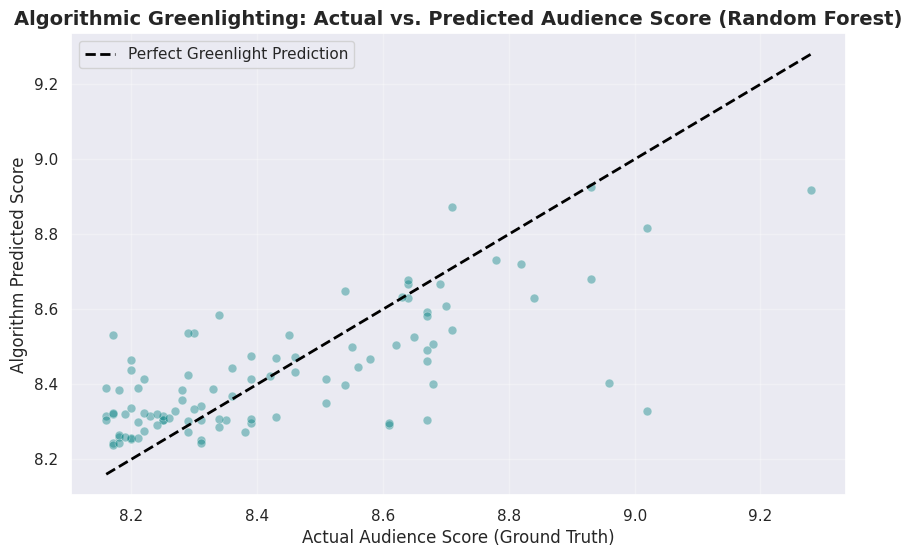


--- 5. ALGORITHMIC FEATURE IMPORTANCE ---


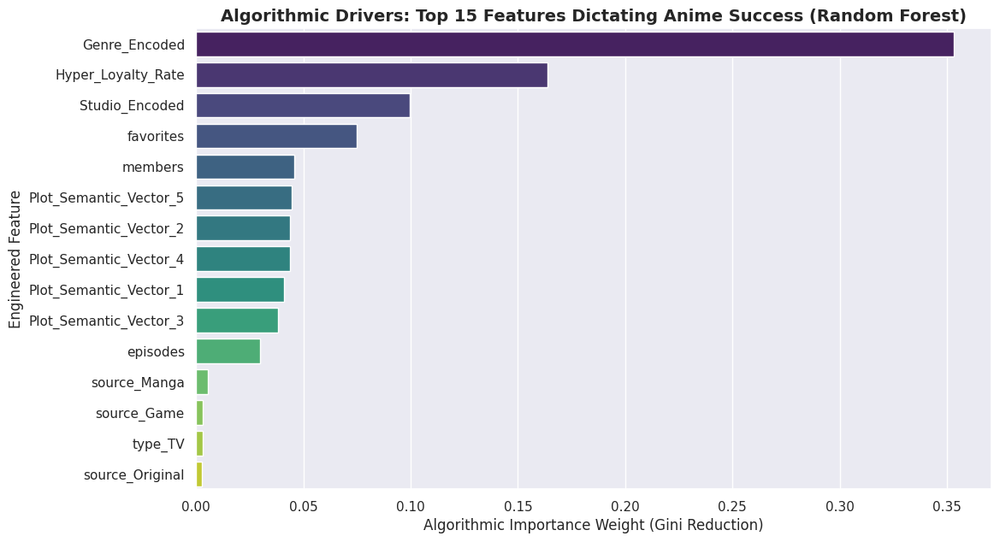

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

print("--- 1. OUT-OF-SAMPLE DATA SPLITTING ---")
X_train, X_test, y_train, y_test = train_test_split(X_adv, y, test_size=0.2, random_state=42)

print(f" Training Set: {len(X_train)} anime properties")
print(f"Testing Set: {len(X_test)} anime properties (Strictly Unseen)")


print("\n--- 2. ALGORITHMIC TRAINING (BAGGING VS. BOOSTING) ---")
# 1. Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=200, max_depth=8, random_state=42, n_jobs=-1)
rf_model.fit(X_train, y_train)

# 2. XGBoost Regressor
xgb_model = XGBRegressor(n_estimators=200, max_depth=6, learning_rate=0.05, random_state=42, n_jobs=-1)
xgb_model.fit(X_train, y_train)

print(" Both Regression Architectures successfully trained.")


print("\n--- 3. OUT-OF-SAMPLE EVALUATION METRICS ---")
rf_preds = rf_model.predict(X_test)
xgb_preds = xgb_model.predict(X_test)

def evaluate_model(name, y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    print(f" {name} Performance:")
    print(f"   -> Mean Absolute Error (MAE): {mae:.2f} Rating Points")
    print(f"   -> Root Mean Squared Error (RMSE): {rmse:.2f} Rating Points")
    print(f"   -> R-Squared (R2): {r2:.4f}")
    return r2, mae

r2_rf, mae_rf = evaluate_model("Random Forest", y_test, rf_preds)
print("-" * 40)
r2_xgb, mae_xgb = evaluate_model("XGBoost", y_test, xgb_preds)

best_model_name = "XGBoost" if r2_xgb > r2_rf else "Random Forest"
best_preds = xgb_preds if r2_xgb > r2_rf else rf_preds
best_model = xgb_model if r2_xgb > r2_rf else rf_model

print(f"\n The {best_model_name} mathematically outperformed the alternative in predictive accuracy.")


print("\n--- 4. VISUALIZING PREDICTIVE ACCURACY ---")
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=best_preds, alpha=0.4, color='teal', s=40)

# Line of Perfect Prediction
min_val = min(y_test.min(), best_preds.min())
max_val = max(y_test.max(), best_preds.max())
plt.plot([min_val, max_val], [min_val, max_val], color='black', linestyle='--', linewidth=2, label='Perfect Greenlight Prediction')

plt.title(f'Algorithmic Greenlighting: Actual vs. Predicted Audience Score ({best_model_name})', fontsize=14, fontweight='bold')
plt.xlabel('Actual Audience Score (Ground Truth)', fontsize=12)
plt.ylabel('Algorithm Predicted Score', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()


print("\n--- 5. ALGORITHMIC FEATURE IMPORTANCE ---")
importances = pd.Series(best_model.feature_importances_, index=X_adv.columns).sort_values(ascending=False).head(15)

plt.figure(figsize=(12, 7))
sns.barplot(x=importances.values, y=importances.index, palette='viridis')
plt.title(f'Algorithmic Drivers: Top 15 Features Dictating Anime Success ({best_model_name})', fontsize=14, fontweight='bold')
plt.xlabel('Algorithmic Importance Weight (Gini Reduction)', fontsize=12)
plt.ylabel('Engineered Feature', fontsize=12)
plt.show()

# Thank You